In [1]:
#!/usr/bin/env python
#-*- coding: utf-8 -*-

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
import os
import base64

In [3]:
!pip install facets-overview

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
# Se carga la base de datos original, para consultar los datos generales para EDA, Distribución y Comparación de medias.

# /content/Concentrado_Datos_Alumno.xlsx --> database para EDA general

df_total = pd.read_excel('/content/Concentrado_Datos_Alumno.xlsx', header=0)
df_total.head(5)

,YEAR_ACADEMICO,NUMERO_ALUMNO,YEAR_EGRESO,YEAR_INGRESO,YEAR_DESDE_EM,RUT,DV,FECHA_NACIMIENTO,EDAD,SEXO,...,MAX_EDUC_PADRES,PART_PIE,HORARIO_LAB,APORTE_FAMILIA,ES_REQ_APOY_PSIC,ENF_COND_FISICA,PC_INTERNET,REG_NAC_DISCAP,DEPORTE,ES_DESERTOR
0,2021,20211TEPSYS1038,1980,2021,41,8806482,8,29/07/1962,58,M,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SI,S
1,2021,20211TEPSYS1037,2011,2021,10,18888612,4,12/12/1991,29,F,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SI,N
2,2021,20211TEPSYS1036,1999,2021,22,10731073,8,28/06/1980,40,F,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SI,S
3,2021,20211TEPSYS1035,2001,2021,20,15367827,8,30/01/1983,38,F,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SI,S
4,2021,20211TEPSYS1034,2016,2021,5,18586858,3,23/09/1993,27,F,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SI,S


In [5]:
df_total.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6702 entries, 0 to 6701
Data columns (total 41 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   YEAR_ACADEMICO     6702 non-null   int64  
 1   NUMERO_ALUMNO      6702 non-null   object 
 2   YEAR_EGRESO        6702 non-null   int64  
 3   YEAR_INGRESO       6702 non-null   int64  
 4   YEAR_DESDE_EM      6702 non-null   int64  
 5   RUT                6702 non-null   int64  
 6   DV                 6702 non-null   object 
 7   FECHA_NACIMIENTO   6702 non-null   object 
 8   EDAD               6702 non-null   int64  
 9   SEXO               6702 non-null   object 
 10  NACIONALIDAD2      6702 non-null   object 
 11  ETNIA_ORIG         2192 non-null   object 
 12  ESTADO_CIVIL2      6702 non-null   object 
 13  SISTEMA_SALUD      6702 non-null   object 
 14  CARRERA            6702 non-null   object 
 15  JORNADA            6702 non-null   object 
 16  PERIODO_MATRICULA  6702 

In [6]:
df_total.columns

Index(['YEAR_ACADEMICO', 'NUMERO_ALUMNO', 'YEAR_EGRESO', 'YEAR_INGRESO',
       'YEAR_DESDE_EM', 'RUT', 'DV', 'FECHA_NACIMIENTO', 'EDAD', 'SEXO',
       'NACIONALIDAD2', 'ETNIA_ORIG', 'ESTADO_CIVIL2', 'SISTEMA_SALUD',
       'CARRERA', 'JORNADA', 'PERIODO_MATRICULA', 'NIVEL', 'ESTADO_ACTUAL',
       'SEDE', 'COMUNA', 'VIVE_COMUNA', 'EST_MEDIA', 'TIPO_COLEGIO', 'NOTA_EM',
       'ES_AVAL', 'MODALIDAD', 'VIA_ADMISION', 'REG_SOC_HOG', 'GRP_FAMILIA',
       'PRIM_ED_SUPERIOR', 'MAX_EDUC_PADRES', 'PART_PIE', 'HORARIO_LAB',
       'APORTE_FAMILIA', 'ES_REQ_APOY_PSIC', 'ENF_COND_FISICA', 'PC_INTERNET',
       'REG_NAC_DISCAP', 'DEPORTE', 'ES_DESERTOR'],
      dtype='object')

In [7]:
# Se realiza una copia de seguridad, y eliminan las columnas que no se trabajan
df_total_ = df_total.copy()

In [8]:
df_total_.shape

(6702, 41)

# Descriptivos Data Total

### Se presenta la totalidad de los datos para contextualizar el problema a tratar

In [9]:
# Exploración a la data total

df_total_.describe()

,YEAR_ACADEMICO,YEAR_EGRESO,YEAR_INGRESO,YEAR_DESDE_EM,RUT,EDAD,PERIODO_MATRICULA,NIVEL,NOTA_EM
count,6702.000000,6702.000000,6702.000000,6702.000000,6.702000e+03,6702.000000,6702.000000,6702.000000,6702.000000
mean,2019.620263,2011.996270,2018.613250,6.616980,1.867484e+07,25.244106,1.003730,2.718741,5.361952
std,1.103005,35.322487,1.397737,35.231602,2.241115e+06,6.921185,0.060966,1.579265,0.417911
min,2018.000000,0.000000,2011.000000,1.000000,6.869460e+05,16.000000,1.000000,1.000000,1.000000
25%,2019.000000,2010.000000,2018.000000,2.000000,1.774534e+07,20.000000,1.000000,1.000000,5.100000
50%,2020.000000,2015.000000,2019.000000,4.000000,1.933058e+07,23.000000,1.000000,3.000000,5.300000
75%,2021.000000,2017.000000,2020.000000,9.000000,2.010471e+07,28.000000,1.000000,4.000000,5.600000
max,2021.000000,2020.000000,2021.000000,2015.000000,2.714743e+07,63.000000,2.000000,5.000000,6.800000


In [10]:
features_t = ['YEAR_ACADEMICO', 'NUMERO_ALUMNO', 'YEAR_EGRESO', 'YEAR_INGRESO',
       'YEAR_DESDE_EM', 'RUT', 'DV', 'FECHA_NACIMIENTO', 'EDAD', 'SEXO',
       'NACIONALIDAD2', 'ETNIA_ORIG', 'ESTADO_CIVIL2', 'SISTEMA_SALUD',
       'CARRERA', 'JORNADA', 'PERIODO_MATRICULA', 'NIVEL', 'ESTADO_ACTUAL',
       'SEDE', 'COMUNA', 'VIVE_COMUNA', 'EST_MEDIA', 'TIPO_COLEGIO', 'NOTA_EM',
       'ES_AVAL', 'MODALIDAD', 'VIA_ADMISION', 'REG_SOC_HOG', 'GRP_FAMILIA',
       'PRIM_ED_SUPERIOR', 'MAX_EDUC_PADRES', 'PART_PIE', 'HORARIO_LAB',
       'APORTE_FAMILIA', 'ES_REQ_APOY_PSIC', 'ENF_COND_FISICA', 'PC_INTERNET',
       'REG_NAC_DISCAP', 'DEPORTE', 'ES_DESERTOR']

In [11]:
# Display the Dive visualization Data Total.
from IPython.core.display import display, HTML

jsonstr = df_total_.to_json(orient='records')
HTML_TEMPLATE = """
        <script src="https://cdnjs.cloudflare.com/ajax/libs/webcomponentsjs/1.3.3/webcomponents-lite.js"></script>
        <link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/1.0.0/facets-dist/facets-jupyter.html">
        <facets-dive id="elem" height="600"></facets-dive>
        <script>
          var data = {jsonstr};
          document.querySelector("#elem").data = data;
        </script>"""
html = HTML_TEMPLATE.format(jsonstr=jsonstr)
display(HTML(html))

In [12]:
# Create the feature stats for the datasets and stringify it.
import base64
from facets_overview.generic_feature_statistics_generator import GenericFeatureStatisticsGenerator

gfsg = GenericFeatureStatisticsGenerator()
proto = gfsg.ProtoFromDataFrames([{'name': 'df_total_', 'table': df_total_}])
#                                  {'name': 'test', 'table': test_data}])
protostr = base64.b64encode(proto.SerializeToString()).decode("utf-8")

In [13]:
# Display the facets overview visualization for this data
from IPython.core.display import display, HTML

HTML_TEMPLATE = """
        <script src="https://cdnjs.cloudflare.com/ajax/libs/webcomponentsjs/1.3.3/webcomponents-lite.js"></script>
        <link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/1.0.0/facets-dist/facets-jupyter.html" >
        <facets-overview id="elem"></facets-overview>
        <script>
          document.querySelector("#elem").protoInput = "{protostr}";
        </script>"""
html = HTML_TEMPLATE.format(protostr=protostr)
display(HTML(html))

# Data para Niveles 1 y 2

## Se carga la data de los niveles 1 y 2 para explorar más en profundidad la diferencia entre el primer y segundo semestre respecto a la deserción

In [14]:
#Se carga la data de los alumnos de Primer semestre (Nivel 1 y 2)


df_niveles = pd.read_excel("/content/PRE_DataSet_Final_Modelo_Niveles_1_2.xlsx", header=0, index_col=None)

In [15]:
df_niveles.head(5)

,YEAR_ACADEMICO,NUMERO_ALUMNO,DISTINTOS_RAMOS_Nivel1,DISTINTOS_PROF_Nivel1,PROM_PRIMERA_NOTA_Nivel1,TOTAL_ASIST_REQUE_Nivel1,TOTAL_ASIST_REAL_Nivel1,TASA_ASISTENCIA_ACUM_Nivel1,TIENE_DATOS_ASISTENCIA_NIVEL1,TOTAL_PROMEDIO_NOTAS_Nivel1,...,MAX_EDUC_PADRES,PART_PIE,HORARIO_LAB,APORTE_FAMILIA,ES_REQ_APOY_PSIC,ENF_COND_FISICA,PC_INTERNET,REG_NAC_DISCAP,DEPORTE,ES_DESERTOR
0,2018,20181ANADE1001,6,6,6.92,87,85,97.70,S,6.83,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SI,N
1,2018,20181ANADE1002,6,6,6.77,87,83,95.40,S,6.67,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SI,N
2,2018,20181ANADE1003,6,6,5.97,87,81,93.10,S,5.81,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SI,N
3,2018,20181ANADE1004,6,6,6.47,87,85,97.70,S,6.14,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SI,N
4,2018,20181ANADE1005,6,6,6.95,87,84,96.55,S,6.92,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SI,N


In [16]:
df_niveles.columns

Index(['YEAR_ACADEMICO', 'NUMERO_ALUMNO', 'DISTINTOS_RAMOS_Nivel1',
       'DISTINTOS_PROF_Nivel1', 'PROM_PRIMERA_NOTA_Nivel1',
       'TOTAL_ASIST_REQUE_Nivel1', 'TOTAL_ASIST_REAL_Nivel1',
       'TASA_ASISTENCIA_ACUM_Nivel1', 'TIENE_DATOS_ASISTENCIA_NIVEL1',
       'TOTAL_PROMEDIO_NOTAS_Nivel1', 'DISTINTOS_RAMOS_Nivel2',
       'DISTINTOS_PROF_Nivel2', 'PROM_PRIMERA_NOTA_Nivel2',
       'TOTAL_ASIST_REQUE_Nivel2', 'TOTAL_ASIST_REAL_Nivel2',
       'TASA_ASISTENCIA_ACUM_Nivel2', 'TIENE_DATOS_ASISTENCIA_NIVEL2',
       'TOTAL_PROMEDIO_NOTAS_Nivel2', 'YEAR_EGRESO', 'YEAR_INGRESO',
       'YEAR_DESDE_EM', 'RUT', 'DV', 'FECHA_NACIMIENTO', 'EDAD', 'SEXO',
       'NACIONALIDAD2', 'ETNIA_ORIG', 'ESTADO_CIVIL2', 'SISTEMA_SALUD',
       'CARRERA', 'JORNADA', 'PERIODO_MATRICULA', 'NIVEL', 'ESTADO_ACTUAL',
       'SEDE', 'COMUNA', 'VIVE_COMUNA', 'EST_MEDIA', 'TIPO_COLEGIO', 'NOTA_EM',
       'ES_AVAL', 'MODALIDAD', 'VIA_ADMISION', 'REG_SOC_HOG', 'GRP_FAMILIA',
       'PRIM_ED_SUPERIOR', 'MAX_EDU

In [17]:
#Se divide la muestra en train_data y test_data. 
#Se usa el argumento stratify que nos permite generar los bloques de entrenamiento y pruebas preservando en ambos
# el porcentaje de las muestras del dataset original. Para ello hay que indicar en este parámetro cuál es el array 
# de valores -que se asociarán a los datos- que determinan las etiquetas cuyas distribuciones se desea preservar.

#train_data, test_data = train_test_split(df,test_size=0.33, random_state=42)




In [18]:
# Se cargan datos para crear el train y test.
features = ['YEAR_ACADEMICO', 'NUMERO_ALUMNO', 'DISTINTOS_RAMOS_Nivel1',
       'DISTINTOS_PROF_Nivel1', 'PROM_PRIMERA_NOTA_Nivel1',
       'TOTAL_ASIST_REQUE_Nivel1', 'TOTAL_ASIST_REAL_Nivel1',
       'TASA_ASISTENCIA_ACUM_Nivel1', 'TIENE_DATOS_ASISTENCIA_NIVEL1',
       'TOTAL_PROMEDIO_NOTAS_Nivel1', 'DISTINTOS_RAMOS_Nivel2',
       'DISTINTOS_PROF_Nivel2', 'PROM_PRIMERA_NOTA_Nivel2',
       'TOTAL_ASIST_REQUE_Nivel2', 'TOTAL_ASIST_REAL_Nivel2',
       'TASA_ASISTENCIA_ACUM_Nivel2', 'TIENE_DATOS_ASISTENCIA_NIVEL2',
       'TOTAL_PROMEDIO_NOTAS_Nivel2', 'YEAR_EGRESO', 'YEAR_INGRESO',
       'YEAR_DESDE_EM', 'RUT', 'DV', 'FECHA_NACIMIENTO', 'EDAD', 'SEXO',
       'NACIONALIDAD2', 'ETNIA_ORIG', 'ESTADO_CIVIL2', 'SISTEMA_SALUD',
       'CARRERA', 'JORNADA', 'PERIODO_MATRICULA', 'NIVEL', 'ESTADO_ACTUAL',
       'SEDE', 'COMUNA', 'VIVE_COMUNA', 'EST_MEDIA', 'TIPO_COLEGIO', 'NOTA_EM',
       'ES_AVAL', 'MODALIDAD', 'VIA_ADMISION', 'REG_SOC_HOG', 'GRP_FAMILIA',
       'PRIM_ED_SUPERIOR', 'MAX_EDUC_PADRES', 'PART_PIE', 'HORARIO_LAB',
       'APORTE_FAMILIA', 'ES_REQ_APOY_PSIC', 'ENF_COND_FISICA', 'PC_INTERNET',
       'REG_NAC_DISCAP', 'DEPORTE', 'ES_DESERTOR']
#train_data = pd.read_excel("/content/PRE_DataSet_Final_Modelo.xlsx", 
                           #names=features)
#test_data = pd.read_excel("/content/PRE_DataSet_Final_Modelo.xlsx", 
                           #names=features)

In [19]:
df_niveles.describe()

,YEAR_ACADEMICO,DISTINTOS_RAMOS_Nivel1,DISTINTOS_PROF_Nivel1,PROM_PRIMERA_NOTA_Nivel1,TOTAL_ASIST_REQUE_Nivel1,TOTAL_ASIST_REAL_Nivel1,TASA_ASISTENCIA_ACUM_Nivel1,TOTAL_PROMEDIO_NOTAS_Nivel1,DISTINTOS_RAMOS_Nivel2,DISTINTOS_PROF_Nivel2,...,TASA_ASISTENCIA_ACUM_Nivel2,TOTAL_PROMEDIO_NOTAS_Nivel2,YEAR_EGRESO,YEAR_INGRESO,YEAR_DESDE_EM,RUT,EDAD,PERIODO_MATRICULA,NIVEL,NOTA_EM
count,1978.000000,1978.000000,1978.000000,1978.000000,1978.000000,1978.000000,1978.000000,1978.000000,1978.000000,1978.000000,...,1978.000000,1978.000000,1978.000000,1978.000000,1978.000000,1.978000e+03,1978.000000,1978.0,1978.0,1978.000000
mean,2019.550051,5.959555,5.438827,5.743271,44.278059,42.186047,84.432321,5.810455,5.894843,5.106168,...,89.230597,5.578847,2013.532356,2019.548028,6.015672,1.899862e+07,24.024772,1.0,1.0,5.350789
std,1.094324,1.262823,1.237808,0.864758,29.016862,27.443339,31.604262,0.612973,1.386058,1.463034,...,18.336069,1.095467,6.292340,1.093027,6.191780,2.157686e+06,6.709440,0.0,0.0,0.400594
min,2018.000000,2.000000,2.000000,0.670000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,0.000000,1.000000,1980.000000,2018.000000,1.000000,8.806482e+06,16.000000,1.0,1.0,4.400000
25%,2019.000000,6.000000,5.000000,5.280000,23.000000,20.000000,90.790000,5.500000,6.000000,4.000000,...,88.460000,5.390000,2011.000000,2019.000000,2.000000,1.819618e+07,19.000000,1.0,1.0,5.000000
50%,2019.500000,6.000000,6.000000,5.830000,56.000000,52.000000,96.880000,5.890000,6.000000,6.000000,...,94.795000,5.830000,2016.000000,2019.000000,3.000000,1.971785e+07,22.000000,1.0,1.0,5.300000
75%,2021.000000,7.000000,6.000000,6.430000,70.000000,66.000000,100.000000,6.220000,7.000000,6.000000,...,100.000000,6.210000,2018.000000,2021.000000,9.000000,2.035599e+07,27.000000,1.0,1.0,5.600000
max,2021.000000,7.000000,7.000000,7.000000,102.000000,94.000000,100.000000,7.000000,8.000000,7.000000,...,100.000000,7.000000,2020.000000,2021.000000,41.000000,2.714743e+07,58.000000,1.0,1.0,6.700000


In [20]:
# Display the Dive visualization for the training data.
from IPython.core.display import display, HTML

jsonstr = df_niveles.to_json(orient='records')
HTML_TEMPLATE = """
        <script src="https://cdnjs.cloudflare.com/ajax/libs/webcomponentsjs/1.3.3/webcomponents-lite.js"></script>
        <link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/1.0.0/facets-dist/facets-jupyter.html">
        <facets-dive id="elem" height="600"></facets-dive>
        <script>
          var data = {jsonstr};
          document.querySelector("#elem").data = data;
        </script>"""
html = HTML_TEMPLATE.format(jsonstr=jsonstr)
display(HTML(html))

In [21]:
# Create the feature stats for the datasets and stringify it.
import base64
from facets_overview.generic_feature_statistics_generator import GenericFeatureStatisticsGenerator

gfsg = GenericFeatureStatisticsGenerator()
proto = gfsg.ProtoFromDataFrames([{'name': 'df_niveles', 'table': df_niveles}])
#                                  {'name': 'test', 'table': test_data}])
protostr = base64.b64encode(proto.SerializeToString()).decode("utf-8")

In [22]:
# Display the facets overview visualization for this data
from IPython.core.display import display, HTML

HTML_TEMPLATE = """
        <script src="https://cdnjs.cloudflare.com/ajax/libs/webcomponentsjs/1.3.3/webcomponents-lite.js"></script>
        <link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/1.0.0/facets-dist/facets-jupyter.html" >
        <facets-overview id="elem"></facets-overview>
        <script>
          document.querySelector("#elem").protoInput = "{protostr}";
        </script>"""
html = HTML_TEMPLATE.format(protostr=protostr)
display(HTML(html))

# PRUEBAS ESTADÍSTICAS
### PRUEBAS DE MEDIAS

In [41]:
# Se cargan librerías
from scipy import stats
from IPython.core.pylabtools import figsize
import matplotlib.pyplot as plt
from matplotlib.pyplot import xlim

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


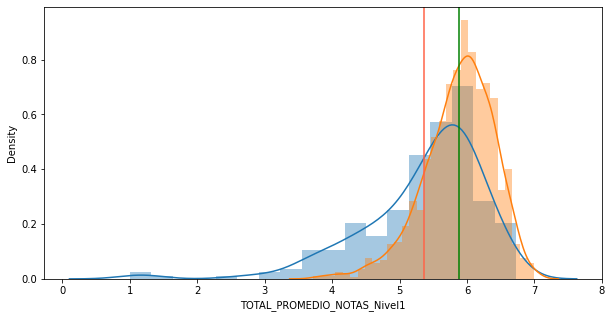

In [40]:

# Tipos de distribución y prueba de Normalidad

figsize(10,5)
mean_S = np.mean(df_niveles.TOTAL_PROMEDIO_NOTAS_Nivel1.loc[df_niveles.ES_DESERTOR=='S'])
mean_N = np.mean(df_niveles.TOTAL_PROMEDIO_NOTAS_Nivel1.loc[df_niveles.ES_DESERTOR=='N'])
sns.distplot(df_niveles.TOTAL_PROMEDIO_NOTAS_Nivel1.loc[df_niveles.ES_DESERTOR=='S'])
sns.distplot(df_niveles.TOTAL_PROMEDIO_NOTAS_Nivel1.loc[df_niveles.ES_DESERTOR=='N'])
plt.axvline(x = mean_S, color = 'tomato', label = 'Promedio')
plt.axvline(x = mean_N, color = 'green', label = 'Promedio')
plt.show();
#            df_niveles.TOTAL_PROMEDIO_NOTAS_Nivel1.loc[df.ES_DESERTOR=='S'],nan_policy='omit')

In [43]:
# Test de comparación de medias entre variables de interés
stats.ttest_ind(df_niveles.TOTAL_PROMEDIO_NOTAS_Nivel1.loc[df_niveles.ES_DESERTOR=='S'],
                df_niveles.TOTAL_PROMEDIO_NOTAS_Nivel1.loc[df_niveles.ES_DESERTOR=='N'],nan_policy='omit')

Ttest_indResult(statistic=-13.467979650614852, pvalue=1.2763617881778193e-39)

Conclusión: al tener un valor p menor que el 5% no existe evidencia para afirmar igualdad de las medias, por tanto deben ser diferentes



In [47]:
import plotly.graph_objects as go
import numpy as np


fig = go.Figure()
# Use x instead of y argument for horizontal plot
fig.add_trace(go.Box(y=df_niveles.TOTAL_PROMEDIO_NOTAS_Nivel1.loc[df_niveles.ES_DESERTOR=='N'],name="No desertor"))
fig.add_trace(go.Box(y=df_niveles.TOTAL_PROMEDIO_NOTAS_Nivel1.loc[df_niveles.ES_DESERTOR=='S'],name="Desertor"))
fig.update_layout(
    title={
        'text': "Comparación PROM_PRIMERA_NOTA entre para Desertor y No Desertor",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()